# Linear Regression model to predict the yearly amount spent of each individual who are using ecommerce store based on the features like avg session length, time on app, time on website etc.

In [86]:
import numpy as np
import pandas as pd


In [87]:
df=pd.read_csv('Ecommerce Customers')

In [88]:
df.head()

,Email,Address,Avatar,Avg. Session Length,Time on App,Time on Website,Length of Membership,Yearly Amount Spent
0,mstephenson@fernandez.com,"835 Frank Tunnel\nWrightmouth, MI 82180-9605",Violet,34.497268,12.655651,39.577668,4.082621,587.951054
1,hduke@hotmail.com,"4547 Archer Common\nDiazchester, CA 06566-8576",DarkGreen,31.926272,11.109461,37.268959,2.664034,392.204933
2,pallen@yahoo.com,"24645 Valerie Unions Suite 582\nCobbborough, D...",Bisque,33.000915,11.330278,37.110597,4.104543,487.547505
3,riverarebecca@gmail.com,"1414 David Throughway\nPort Jason, OH 22070-1220",SaddleBrown,34.305557,13.717514,36.721283,3.120179,581.852344
4,mstephens@davidson-herman.com,"14023 Rodriguez Passage\nPort Jacobville, PR 3...",MediumAquaMarine,33.330673,12.795189,37.536653,4.446308,599.406092


In [170]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Email                 500 non-null    object 
 1   Address               500 non-null    object 
 2   Avatar                500 non-null    object 
 3   Avg. Session Length   500 non-null    float64
 4   Time on App           500 non-null    float64
 5   Time on Website       500 non-null    float64
 6   Length of Membership  500 non-null    float64
 7   Yearly Amount Spent   500 non-null    float64
dtypes: float64(5), object(3)
memory usage: 31.4+ KB


In [171]:
df.describe(include='all')

,Email,Address,Avatar,Avg. Session Length,Time on App,Time on Website,Length of Membership,Yearly Amount Spent
count,500,500,500,500.000000,500.000000,500.000000,500.000000,500.000000
unique,500,500,138,NaN,NaN,NaN,NaN,NaN
top,mstephenson@fernandez.com,"835 Frank Tunnel\nWrightmouth, MI 82180-9605",SlateBlue,NaN,NaN,NaN,NaN,NaN
freq,1,1,7,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,33.053194,12.052488,37.060445,3.533462,499.314038
std,NaN,NaN,NaN,0.992563,0.994216,1.010489,0.999278,79.314782
min,NaN,NaN,NaN,29.532429,8.508152,33.913847,0.269901,256.670582
25%,NaN,NaN,NaN,32.341822,11.388153,36.349257,2.930450,445.038277
50%,NaN,NaN,NaN,33.082008,11.983231,37.069367,3.533975,498.887875
75%,NaN,NaN,NaN,33.711985,12.753850,37.716432,4.126502,549.313828


In [172]:
df

,Email,Address,Avatar,Avg. Session Length,Time on App,Time on Website,Length of Membership,Yearly Amount Spent
0,mstephenson@fernandez.com,"835 Frank Tunnel\nWrightmouth, MI 82180-9605",Violet,34.497268,12.655651,39.577668,4.082621,587.951054
1,hduke@hotmail.com,"4547 Archer Common\nDiazchester, CA 06566-8576",DarkGreen,31.926272,11.109461,37.268959,2.664034,392.204933
2,pallen@yahoo.com,"24645 Valerie Unions Suite 582\nCobbborough, D...",Bisque,33.000915,11.330278,37.110597,4.104543,487.547505
3,riverarebecca@gmail.com,"1414 David Throughway\nPort Jason, OH 22070-1220",SaddleBrown,34.305557,13.717514,36.721283,3.120179,581.852344
4,mstephens@davidson-herman.com,"14023 Rodriguez Passage\nPort Jacobville, PR 3...",MediumAquaMarine,33.330673,12.795189,37.536653,4.446308,599.406092
...,...,...,...,...,...,...,...,...
495,lewisjessica@craig-evans.com,"4483 Jones Motorway Suite 872\nLake Jamiefurt,...",Tan,33.237660,13.566160,36.417985,3.746573,573.847438
496,katrina56@gmail.com,"172 Owen Divide Suite 497\nWest Richard, CA 19320",PaleVioletRed,34.702529,11.695736,37.190268,3.576526,529.049004
497,dale88@hotmail.com,"0787 Andrews Ranch Apt. 633\nSouth Chadburgh, ...",Cornsilk,32.646777,11.499409,38.332576,4.958264,551.620145
498,cwilson@hotmail.com,"680 Jennifer Lodge Apt. 808\nBrendachester, TX...",Teal,33.322501,12.391423,36.840086,2.336485,456.469510


In [173]:
df[df['Time on App']>=13]

,Email,Address,Avatar,Avg. Session Length,Time on App,Time on Website,Length of Membership,Yearly Amount Spent
3,riverarebecca@gmail.com,"1414 David Throughway\nPort Jason, OH 22070-1220",SaddleBrown,34.305557,13.717514,36.721283,3.120179,581.852344
8,vchurch@walter-martinez.com,"860 Lee Key\nWest Debra, SD 97450-0495",Salmon,33.987773,13.386235,37.534497,3.273434,570.200409
10,andrew06@peterson.com,"26104 Alexander Groves\nAlexandriaport, WY 282...",Tomato,33.992573,13.338975,37.225806,2.482608,492.606013
14,taylormason@gmail.com,"7773 Powell Springs Suite 190\nSamanthaland, N...",DarkBlue,32.387976,13.148726,36.619957,2.494544,470.452733
18,alejandro75@hotmail.com,"64475 Andre Club Apt. 795\nPort Dannytown, PW ...",Cyan,32.187812,14.715388,38.244115,1.516576,452.315675
...,...,...,...,...,...,...,...,...
464,susanibarra@yahoo.com,"426 Scott Radial Apt. 065\nAbigailstad, MS 165...",Thistle,32.533240,14.121784,38.406329,5.320094,689.235700
469,kstafford@estes-nguyen.com,"PSC 4856, Box 1297\nAPO AA 17032-7944",YellowGreen,31.169507,13.970181,36.673953,1.785174,427.356531
474,antonioharris@hotmail.com,"4307 Nicholas Drive Apt. 259\nRamirezberg, AS ...",MediumBlue,33.700886,13.471578,37.071643,2.379076,492.556834
494,kellydeborah@chan.biz,"354 Sanchez Wall Suite 884\nJuliabury, VI 39735",DarkTurquoise,33.431097,13.350632,37.965972,2.768852,510.661792


In [174]:
df[(df['Time on App']>=13.7) & (df['Time on App']<=13.8)]

,Email,Address,Avatar,Avg. Session Length,Time on App,Time on Website,Length of Membership,Yearly Amount Spent
3,riverarebecca@gmail.com,"1414 David Throughway\nPort Jason, OH 22070-1220",SaddleBrown,34.305557,13.717514,36.721283,3.120179,581.852344
56,gregoryholmes@hotmail.com,"2891 Martin Plain Suite 197\nMelaniestad, NE 6...",DarkSalmon,32.688229,13.761533,39.252931,2.995761,520.898794
62,ryan36@gmail.com,"5379 Rhonda Prairie Apt. 696\nBrownland, WA 87027",DarkTurquoise,32.227299,13.728627,37.997028,4.802631,613.599323
213,audreyguerrero@carey.com,"1995 Susan Locks Suite 760\nEast Cheryl, AR 37...",BlueViolet,34.330750,13.722454,35.773116,2.909008,558.427257


In [175]:
import matplotlib.pyplot as plt
import seaborn as sns

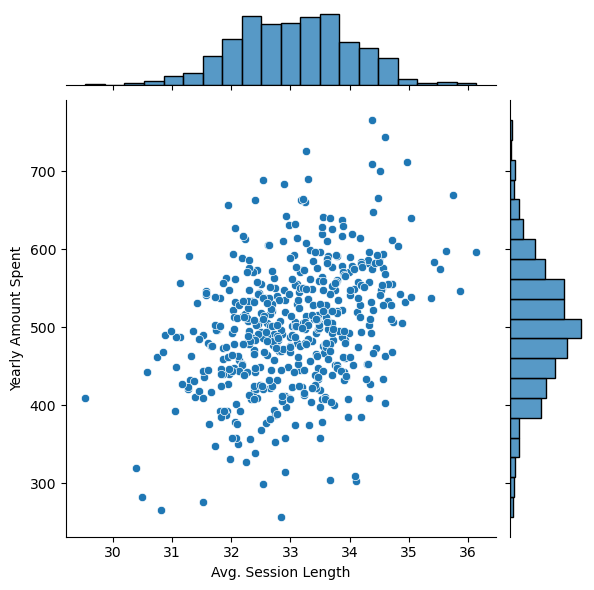

In [95]:
sns.jointplot(x='Avg. Session Length',y='Yearly Amount Spent',data=df)

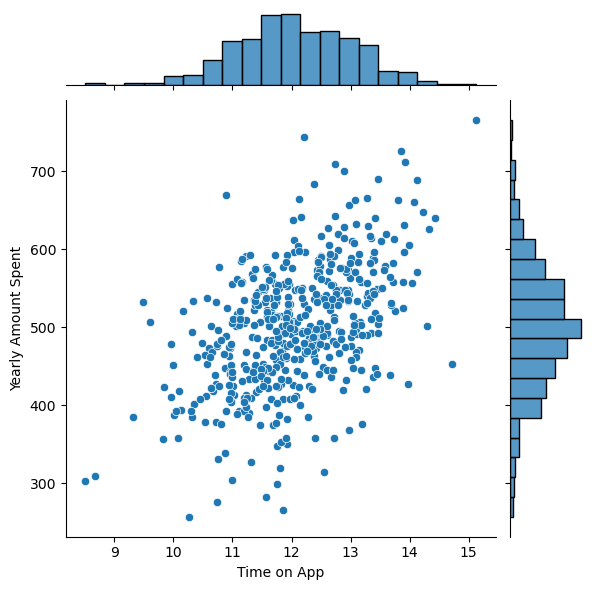

In [96]:
sns.jointplot(x='Time on App',y='Yearly Amount Spent',data=df)

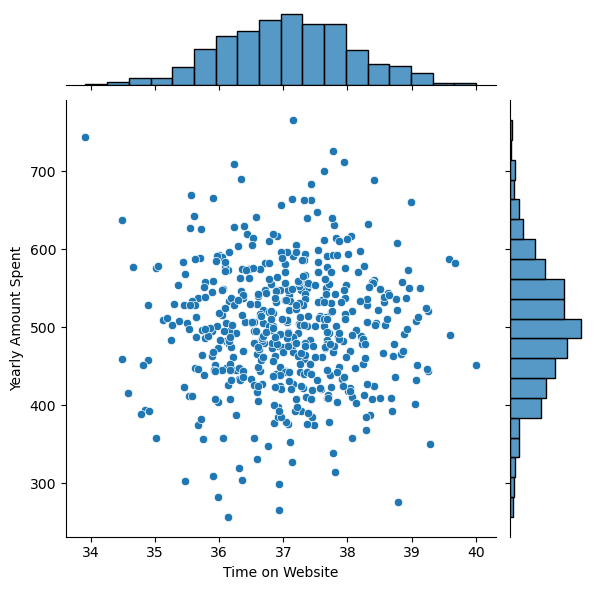

In [97]:
sns.jointplot(x='Time on Website',y='Yearly Amount Spent',data=df)

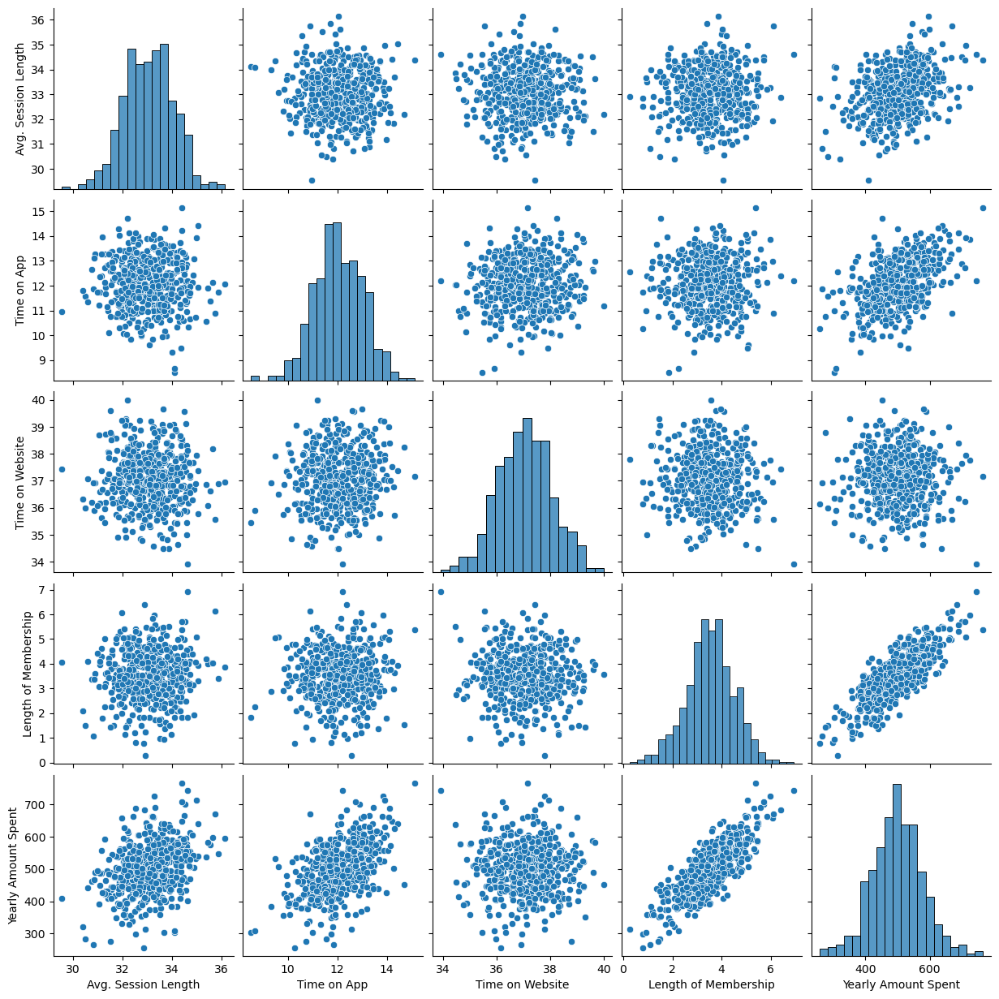

In [98]:
sns.pairplot(df)

In [99]:
df

,Email,Address,Avatar,Avg. Session Length,Time on App,Time on Website,Length of Membership,Yearly Amount Spent
0,mstephenson@fernandez.com,"835 Frank Tunnel\nWrightmouth, MI 82180-9605",Violet,34.497268,12.655651,39.577668,4.082621,587.951054
1,hduke@hotmail.com,"4547 Archer Common\nDiazchester, CA 06566-8576",DarkGreen,31.926272,11.109461,37.268959,2.664034,392.204933
2,pallen@yahoo.com,"24645 Valerie Unions Suite 582\nCobbborough, D...",Bisque,33.000915,11.330278,37.110597,4.104543,487.547505
3,riverarebecca@gmail.com,"1414 David Throughway\nPort Jason, OH 22070-1220",SaddleBrown,34.305557,13.717514,36.721283,3.120179,581.852344
4,mstephens@davidson-herman.com,"14023 Rodriguez Passage\nPort Jacobville, PR 3...",MediumAquaMarine,33.330673,12.795189,37.536653,4.446308,599.406092
...,...,...,...,...,...,...,...,...
495,lewisjessica@craig-evans.com,"4483 Jones Motorway Suite 872\nLake Jamiefurt,...",Tan,33.237660,13.566160,36.417985,3.746573,573.847438
496,katrina56@gmail.com,"172 Owen Divide Suite 497\nWest Richard, CA 19320",PaleVioletRed,34.702529,11.695736,37.190268,3.576526,529.049004
497,dale88@hotmail.com,"0787 Andrews Ranch Apt. 633\nSouth Chadburgh, ...",Cornsilk,32.646777,11.499409,38.332576,4.958264,551.620145
498,cwilson@hotmail.com,"680 Jennifer Lodge Apt. 808\nBrendachester, TX...",Teal,33.322501,12.391423,36.840086,2.336485,456.469510


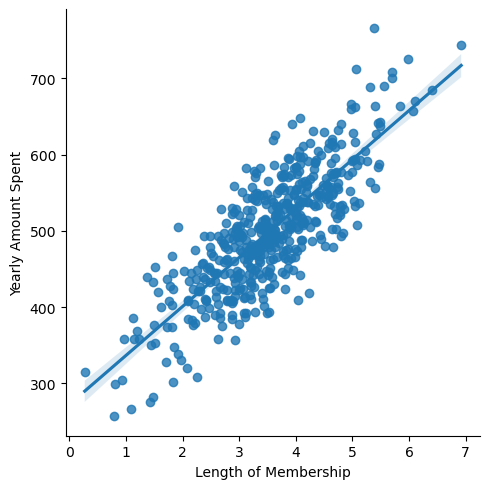

In [100]:
sns.lmplot(x='Length of Membership',y='Yearly Amount Spent',data=df)

In [101]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [102]:
df.head()

,Email,Address,Avatar,Avg. Session Length,Time on App,Time on Website,Length of Membership,Yearly Amount Spent
0,mstephenson@fernandez.com,"835 Frank Tunnel\nWrightmouth, MI 82180-9605",Violet,34.497268,12.655651,39.577668,4.082621,587.951054
1,hduke@hotmail.com,"4547 Archer Common\nDiazchester, CA 06566-8576",DarkGreen,31.926272,11.109461,37.268959,2.664034,392.204933
2,pallen@yahoo.com,"24645 Valerie Unions Suite 582\nCobbborough, D...",Bisque,33.000915,11.330278,37.110597,4.104543,487.547505
3,riverarebecca@gmail.com,"1414 David Throughway\nPort Jason, OH 22070-1220",SaddleBrown,34.305557,13.717514,36.721283,3.120179,581.852344
4,mstephens@davidson-herman.com,"14023 Rodriguez Passage\nPort Jacobville, PR 3...",MediumAquaMarine,33.330673,12.795189,37.536653,4.446308,599.406092


In [103]:
x=df[['Avg. Session Length','Time on App','Time on Website','Length of Membership']]
y=df['Yearly Amount Spent']

In [104]:
x

,Avg. Session Length,Time on App,Time on Website,Length of Membership
0,34.497268,12.655651,39.577668,4.082621
1,31.926272,11.109461,37.268959,2.664034
2,33.000915,11.330278,37.110597,4.104543
3,34.305557,13.717514,36.721283,3.120179
4,33.330673,12.795189,37.536653,4.446308
...,...,...,...,...
495,33.237660,13.566160,36.417985,3.746573
496,34.702529,11.695736,37.190268,3.576526
497,32.646777,11.499409,38.332576,4.958264
498,33.322501,12.391423,36.840086,2.336485


In [105]:
y

0      587.951054
1      392.204933
2      487.547505
3      581.852344
4      599.406092
          ...    
495    573.847438
496    529.049004
497    551.620145
498    456.469510
499    497.778642
Name: Yearly Amount Spent, Length: 500, dtype: float64

In [106]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=101)

In [107]:
lm=LinearRegression()

In [108]:
lm.fit(x_train,y_train)

LinearRegression()

In [109]:
lm.coef_

array([25.98154972, 38.59015875,  0.19040528, 61.27909654])

In [110]:
predection=lm.predict(x_test)

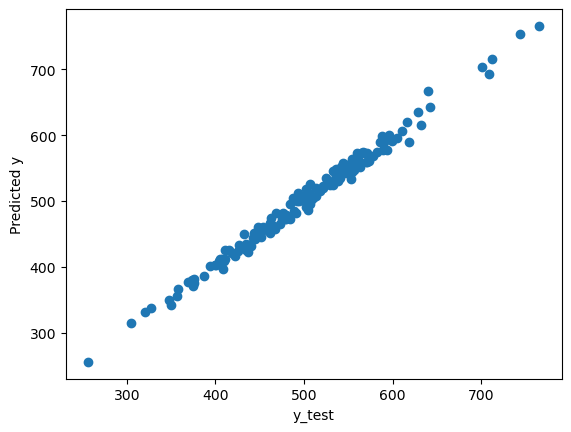

In [111]:
plt.scatter(y_test,predection)
plt.xlabel('y_test')
plt.ylabel('Predicted y')
plt.show()

In [112]:
from sklearn import metrics

In [113]:
print('mse-', metrics.mean_squared_error(y_test,predection))
print('mae-', metrics.mean_absolute_error(y_test,predection))
print('rmse-', np.sqrt(metrics.mean_squared_error(y_test,predection)))

mse- 79.81305165097451
mae- 7.228148653430838
rmse- 8.933815066978637


In [114]:
print(len(predection))
predection

150


array([456.44186104, 402.72005312, 409.2531539 , 591.4310343 ,
       590.01437275, 548.82396607, 577.59737969, 715.44428115,
       473.7893446 , 545.9211364 , 337.8580314 , 500.38506697,
       552.93478041, 409.6038964 , 765.52590754, 545.83973731,
       693.25969124, 507.32416226, 573.10533175, 573.2076631 ,
       397.44989709, 555.0985107 , 458.19868141, 482.66899911,
       559.2655959 , 413.00946082, 532.25727408, 377.65464817,
       535.0209653 , 447.80070905, 595.54339577, 667.14347072,
       511.96042791, 573.30433971, 505.02260887, 565.30254655,
       460.38785393, 449.74727868, 422.87193429, 456.55615271,
       598.10493696, 449.64517443, 615.34948995, 511.88078685,
       504.37568058, 515.95249276, 568.64597718, 551.61444684,
       356.5552241 , 464.9759817 , 481.66007708, 534.2220025 ,
       256.28674001, 505.30810714, 520.01844434, 315.0298707 ,
       501.98080155, 387.03842642, 472.97419543, 432.8704675 ,
       539.79082198, 590.03070739, 752.86997652, 558.27

In [115]:
y_test

18     452.315675
361    401.033135
104    410.069611
4      599.406092
156    586.155870
          ...    
147    479.731938
346    488.387526
423    461.112248
17     407.704548
259    375.398455
Name: Yearly Amount Spent, Length: 150, dtype: float64

C:\Users\saura\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Yearly Amount Spent', ylabel='Density'>

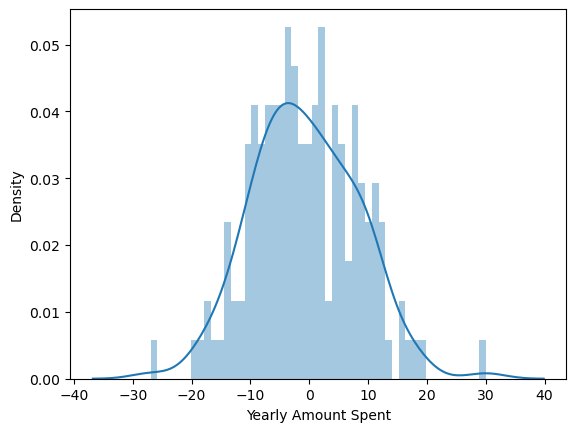

In [116]:
sns.distplot(y_test-predection,bins=50)

In [117]:
pre=y_test-predection
pre

18    -4.126186
361   -1.686918
104    0.816457
4      7.975058
156   -3.858503
         ...   
147    1.431172
346    3.977230
423    3.521249
17    -3.822028
259   -0.080551
Name: Yearly Amount Spent, Length: 150, dtype: float64

In [118]:
df1=pd.DataFrame(lm.coef_,x.columns)
df1.columns=['Coeffeicints']
df1

,Coeffeicints
Avg. Session Length,25.981550
Time on App,38.590159
Time on Website,0.190405
Length of Membership,61.279097


In [119]:
import  pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import numpy as np

In [120]:
df2=pd.read_csv('Vehicle.csv')
df2

,Hour,Vehicles
0,1,699
1,2,346
2,3,193
3,4,191
4,5,193
...,...,...
1684,1685,194
1685,1686,373
1686,1687,1218
1687,1688,4076


In [121]:
df2.head()

,Hour,Vehicles
0,1,699
1,2,346
2,3,193
3,4,191
4,5,193


In [122]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1689 entries, 0 to 1688
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype
---  ------    --------------  -----
 0   Hour      1689 non-null   int64
 1   Vehicles  1689 non-null   int64
dtypes: int64(2)
memory usage: 26.5 KB


In [123]:
df2[(df2['Hour']==3) & (df2['Hour']==5)]



,Hour,Vehicles


In [124]:
df2[df2['Hour']<=3]

,Hour,Vehicles
0,1,699
1,2,346
2,3,193


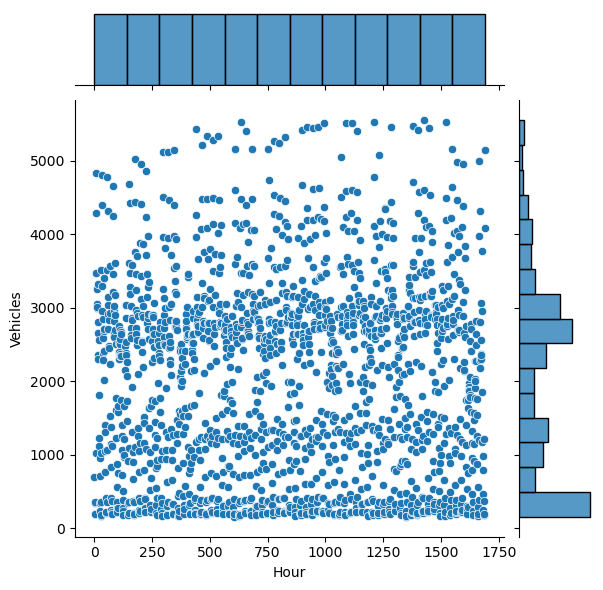

In [125]:
sns.jointplot(x='Hour', y='Vehicles', data=df2)

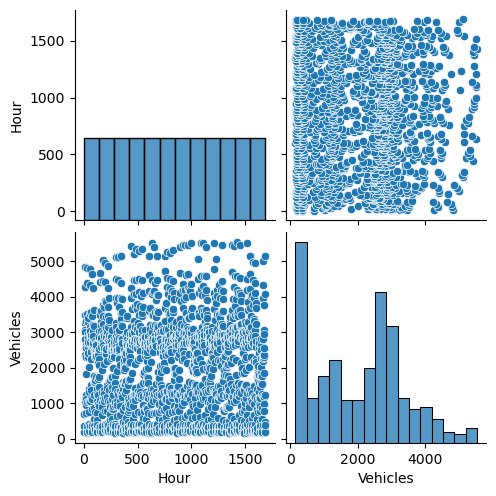

In [126]:
sns.pairplot(data=df2)

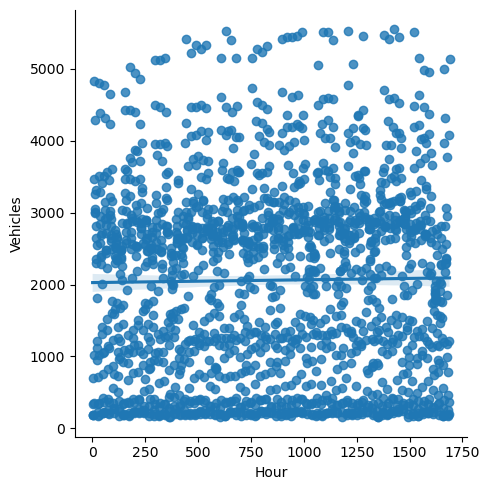

In [127]:
sns.lmplot(x='Hour', y='Vehicles', data=df2)

In [128]:
df3=pd.read_csv('nba_2022_2023.csv')
df3

,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,Precious Achiuwa,C,23,TOR,55,12,20.7,3.6,7.3,0.485,...,0.702,1.8,4.1,6.0,0.9,0.6,0.5,1.1,1.9,9.2
1,Steven Adams,C,29,MEM,42,42,27.0,3.7,6.3,0.597,...,0.364,5.1,6.5,11.5,2.3,0.9,1.1,1.9,2.3,8.6
2,Bam Adebayo,C,25,MIA,75,75,34.6,8.0,14.9,0.540,...,0.806,2.5,6.7,9.2,3.2,1.2,0.8,2.5,2.8,20.4
3,Ochai Agbaji,SG,22,UTA,59,22,20.5,2.8,6.5,0.427,...,0.812,0.7,1.3,2.1,1.1,0.3,0.3,0.7,1.7,7.9
4,Santi Aldama,PF,22,MEM,77,20,21.8,3.2,6.8,0.470,...,0.750,1.1,3.7,4.8,1.3,0.6,0.6,0.8,1.9,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
674,Thaddeus Young,PF,34,TOR,54,9,14.7,2.0,3.7,0.545,...,0.692,1.3,1.8,3.1,1.4,1.0,0.1,0.8,1.6,4.4
675,Trae Young,PG,24,ATL,73,73,34.8,8.2,19.0,0.429,...,0.886,0.8,2.2,3.0,10.2,1.1,0.1,4.1,1.4,26.2
676,Omer Yurtseven,C,24,MIA,9,0,9.2,1.8,3.0,0.593,...,0.833,0.9,1.7,2.6,0.2,0.2,0.2,0.4,1.8,4.4
677,Cody Zeller,C,30,MIA,15,2,14.5,2.5,3.9,0.627,...,0.686,1.7,2.6,4.3,0.7,0.2,0.3,0.9,2.2,6.5


In [129]:
df3.head()

,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,Precious Achiuwa,C,23,TOR,55,12,20.7,3.6,7.3,0.485,...,0.702,1.8,4.1,6.0,0.9,0.6,0.5,1.1,1.9,9.2
1,Steven Adams,C,29,MEM,42,42,27.0,3.7,6.3,0.597,...,0.364,5.1,6.5,11.5,2.3,0.9,1.1,1.9,2.3,8.6
2,Bam Adebayo,C,25,MIA,75,75,34.6,8.0,14.9,0.540,...,0.806,2.5,6.7,9.2,3.2,1.2,0.8,2.5,2.8,20.4
3,Ochai Agbaji,SG,22,UTA,59,22,20.5,2.8,6.5,0.427,...,0.812,0.7,1.3,2.1,1.1,0.3,0.3,0.7,1.7,7.9
4,Santi Aldama,PF,22,MEM,77,20,21.8,3.2,6.8,0.470,...,0.750,1.1,3.7,4.8,1.3,0.6,0.6,0.8,1.9,9.0


In [130]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 679 entries, 0 to 678
Data columns (total 29 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Player  679 non-null    object 
 1   Pos     679 non-null    object 
 2   Age     679 non-null    int64  
 3   Tm      679 non-null    object 
 4   G       679 non-null    int64  
 5   GS      679 non-null    int64  
 6   MP      679 non-null    float64
 7   FG      679 non-null    float64
 8   FGA     679 non-null    float64
 9   FG%     676 non-null    float64
 10  3P      679 non-null    float64
 11  3PA     679 non-null    float64
 12  3P%     655 non-null    float64
 13  2P      679 non-null    float64
 14  2PA     679 non-null    float64
 15  2P%     672 non-null    float64
 16  eFG%    676 non-null    float64
 17  FT      679 non-null    float64
 18  FTA     679 non-null    float64
 19  FT%     642 non-null    float64
 20  ORB     679 non-null    float64
 21  DRB     679 non-null    float64
 22  TR

In [131]:
df3[df3['3P%'].isna()]

,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
21,Udoka Azubuike,C,23,UTA,36,4,10.0,1.6,2.0,0.819,...,0.350,0.9,2.4,3.3,0.3,0.2,0.4,0.5,0.9,3.5
60,Bismack Biyombo,C,30,PHO,61,14,14.3,2.0,3.4,0.578,...,0.357,1.5,2.8,4.3,0.9,0.3,1.4,0.8,1.9,4.3
87,Moses Brown,C,23,TOT,36,1,8.2,1.7,2.7,0.635,...,0.458,1.6,2.3,3.9,0.1,0.1,0.4,0.4,1.1,4.3
88,Moses Brown,C,23,LAC,34,1,8.5,1.8,2.8,0.635,...,0.458,1.7,2.4,4.1,0.1,0.1,0.4,0.4,1.1,4.6
89,Moses Brown,C,23,BRK,2,0,3.0,0.0,0.0,NaN,...,NaN,0.0,0.0,0.0,0.0,0.5,0.0,0.5,0.5,0.0
107,Vernon Carey Jr.,C,21,WAS,11,0,2.5,0.2,0.7,0.250,...,1.000,0.3,0.7,1.0,0.3,0.2,0.2,0.2,0.5,0.5
116,Justin Champagnie,SF,21,TOR,3,0,3.7,1.0,1.0,1.000,...,NaN,0.3,1.0,1.3,0.3,0.0,0.0,0.0,0.3,2.0
127,Chance Comanche,C,26,POR,1,0,21.0,3.0,5.0,0.600,...,0.250,2.0,1.0,3.0,0.0,0.0,1.0,0.0,0.0,7.0
196,Michael Foster Jr.,PF,20,PHI,1,0,1.0,0.0,0.0,NaN,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
201,Daniel Gafford,C,24,WAS,78,47,20.6,3.7,5.1,0.732,...,0.679,2.1,3.5,5.6,1.1,0.4,1.3,1.1,2.4,9.0


In [132]:
df3.isna().sum()

Player     0
Pos        0
Age        0
Tm         0
G          0
GS         0
MP         0
FG         0
FGA        0
FG%        3
3P         0
3PA        0
3P%       24
2P         0
2PA        0
2P%        7
eFG%       3
FT         0
FTA        0
FT%       37
ORB        0
DRB        0
TRB        0
AST        0
STL        0
BLK        0
TOV        0
PF         0
PTS        0
dtype: int64

In [133]:
df3.fillna({'eFG%':df3['eFG%'].mean()}, inplace=True)

In [134]:
df3.isna().sum()

Player     0
Pos        0
Age        0
Tm         0
G          0
GS         0
MP         0
FG         0
FGA        0
FG%        3
3P         0
3PA        0
3P%       24
2P         0
2PA        0
2P%        7
eFG%       0
FT         0
FTA        0
FT%       37
ORB        0
DRB        0
TRB        0
AST        0
STL        0
BLK        0
TOV        0
PF         0
PTS        0
dtype: int64

In [135]:
df3['FT%'].fillna((df3['FGA']+df3['TOV']+(0.44*df3['FTA'])), inplace=True)

In [136]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 679 entries, 0 to 678
Data columns (total 29 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Player  679 non-null    object 
 1   Pos     679 non-null    object 
 2   Age     679 non-null    int64  
 3   Tm      679 non-null    object 
 4   G       679 non-null    int64  
 5   GS      679 non-null    int64  
 6   MP      679 non-null    float64
 7   FG      679 non-null    float64
 8   FGA     679 non-null    float64
 9   FG%     676 non-null    float64
 10  3P      679 non-null    float64
 11  3PA     679 non-null    float64
 12  3P%     655 non-null    float64
 13  2P      679 non-null    float64
 14  2PA     679 non-null    float64
 15  2P%     672 non-null    float64
 16  eFG%    679 non-null    float64
 17  FT      679 non-null    float64
 18  FTA     679 non-null    float64
 19  FT%     679 non-null    float64
 20  ORB     679 non-null    float64
 21  DRB     679 non-null    float64
 22  TR

In [137]:
df3.isna().sum()

Player     0
Pos        0
Age        0
Tm         0
G          0
GS         0
MP         0
FG         0
FGA        0
FG%        3
3P         0
3PA        0
3P%       24
2P         0
2PA        0
2P%        7
eFG%       0
FT         0
FTA        0
FT%        0
ORB        0
DRB        0
TRB        0
AST        0
STL        0
BLK        0
TOV        0
PF         0
PTS        0
dtype: int64

In [138]:
df3['3P%'].mask(df3['3PA']==0,0, inplace=True)

In [139]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 679 entries, 0 to 678
Data columns (total 29 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Player  679 non-null    object 
 1   Pos     679 non-null    object 
 2   Age     679 non-null    int64  
 3   Tm      679 non-null    object 
 4   G       679 non-null    int64  
 5   GS      679 non-null    int64  
 6   MP      679 non-null    float64
 7   FG      679 non-null    float64
 8   FGA     679 non-null    float64
 9   FG%     676 non-null    float64
 10  3P      679 non-null    float64
 11  3PA     679 non-null    float64
 12  3P%     679 non-null    float64
 13  2P      679 non-null    float64
 14  2PA     679 non-null    float64
 15  2P%     672 non-null    float64
 16  eFG%    679 non-null    float64
 17  FT      679 non-null    float64
 18  FTA     679 non-null    float64
 19  FT%     679 non-null    float64
 20  ORB     679 non-null    float64
 21  DRB     679 non-null    float64
 22  TR

In [140]:
df3.isna().sum()

Player    0
Pos       0
Age       0
Tm        0
G         0
GS        0
MP        0
FG        0
FGA       0
FG%       3
3P        0
3PA       0
3P%       0
2P        0
2PA       0
2P%       7
eFG%      0
FT        0
FTA       0
FT%       0
ORB       0
DRB       0
TRB       0
AST       0
STL       0
BLK       0
TOV       0
PF        0
PTS       0
dtype: int64

In [141]:
df3['2P%'].fillna(0, inplace=True)

In [142]:
df3.isna().sum()

Player    0
Pos       0
Age       0
Tm        0
G         0
GS        0
MP        0
FG        0
FGA       0
FG%       3
3P        0
3PA       0
3P%       0
2P        0
2PA       0
2P%       0
eFG%      0
FT        0
FTA       0
FT%       0
ORB       0
DRB       0
TRB       0
AST       0
STL       0
BLK       0
TOV       0
PF        0
PTS       0
dtype: int64

In [143]:
df3[df3['FGA']==0]

,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
89,Moses Brown,C,23,BRK,2,0,3.0,0.0,0.0,NaN,...,0.5,0.0,0.0,0.0,0.0,0.5,0.0,0.5,0.5,0.0
196,Michael Foster Jr.,PF,20,PHI,1,0,1.0,0.0,0.0,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
652,Alondes Williams,SG,23,BRK,1,0,5.0,0.0,0.0,NaN,...,2.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0,1.0,0.0


In [144]:
df3['FG%'].fillna(0,inplace=True)

In [145]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 679 entries, 0 to 678
Data columns (total 29 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Player  679 non-null    object 
 1   Pos     679 non-null    object 
 2   Age     679 non-null    int64  
 3   Tm      679 non-null    object 
 4   G       679 non-null    int64  
 5   GS      679 non-null    int64  
 6   MP      679 non-null    float64
 7   FG      679 non-null    float64
 8   FGA     679 non-null    float64
 9   FG%     679 non-null    float64
 10  3P      679 non-null    float64
 11  3PA     679 non-null    float64
 12  3P%     679 non-null    float64
 13  2P      679 non-null    float64
 14  2PA     679 non-null    float64
 15  2P%     679 non-null    float64
 16  eFG%    679 non-null    float64
 17  FT      679 non-null    float64
 18  FTA     679 non-null    float64
 19  FT%     679 non-null    float64
 20  ORB     679 non-null    float64
 21  DRB     679 non-null    float64
 22  TR

In [146]:
df3.isna().sum()

Player    0
Pos       0
Age       0
Tm        0
G         0
GS        0
MP        0
FG        0
FGA       0
FG%       0
3P        0
3PA       0
3P%       0
2P        0
2PA       0
2P%       0
eFG%      0
FT        0
FTA       0
FT%       0
ORB       0
DRB       0
TRB       0
AST       0
STL       0
BLK       0
TOV       0
PF        0
PTS       0
dtype: int64

In [147]:
df3

,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,Precious Achiuwa,C,23,TOR,55,12,20.7,3.6,7.3,0.485,...,0.702,1.8,4.1,6.0,0.9,0.6,0.5,1.1,1.9,9.2
1,Steven Adams,C,29,MEM,42,42,27.0,3.7,6.3,0.597,...,0.364,5.1,6.5,11.5,2.3,0.9,1.1,1.9,2.3,8.6
2,Bam Adebayo,C,25,MIA,75,75,34.6,8.0,14.9,0.540,...,0.806,2.5,6.7,9.2,3.2,1.2,0.8,2.5,2.8,20.4
3,Ochai Agbaji,SG,22,UTA,59,22,20.5,2.8,6.5,0.427,...,0.812,0.7,1.3,2.1,1.1,0.3,0.3,0.7,1.7,7.9
4,Santi Aldama,PF,22,MEM,77,20,21.8,3.2,6.8,0.470,...,0.750,1.1,3.7,4.8,1.3,0.6,0.6,0.8,1.9,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
674,Thaddeus Young,PF,34,TOR,54,9,14.7,2.0,3.7,0.545,...,0.692,1.3,1.8,3.1,1.4,1.0,0.1,0.8,1.6,4.4
675,Trae Young,PG,24,ATL,73,73,34.8,8.2,19.0,0.429,...,0.886,0.8,2.2,3.0,10.2,1.1,0.1,4.1,1.4,26.2
676,Omer Yurtseven,C,24,MIA,9,0,9.2,1.8,3.0,0.593,...,0.833,0.9,1.7,2.6,0.2,0.2,0.2,0.4,1.8,4.4
677,Cody Zeller,C,30,MIA,15,2,14.5,2.5,3.9,0.627,...,0.686,1.7,2.6,4.3,0.7,0.2,0.3,0.9,2.2,6.5


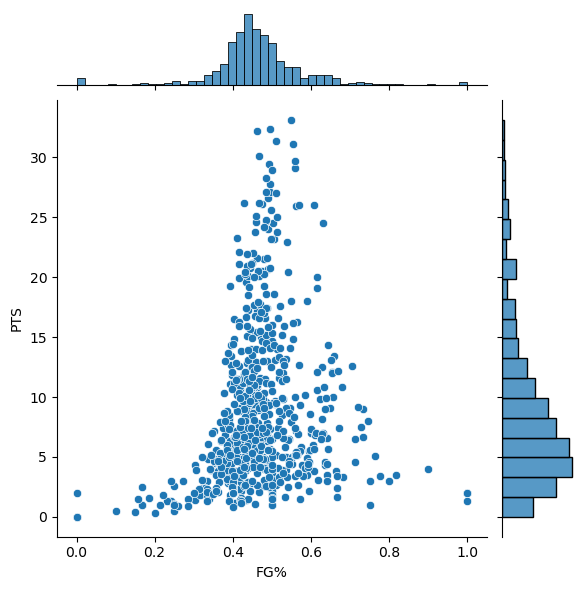

In [148]:
sns.jointplot(x='FG%', y='PTS', data=df3)

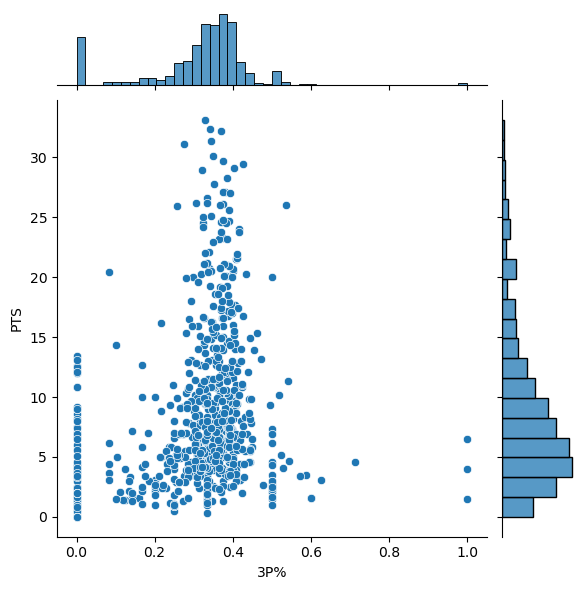

In [149]:
sns.jointplot(x='3P%', y='PTS', data=df3)

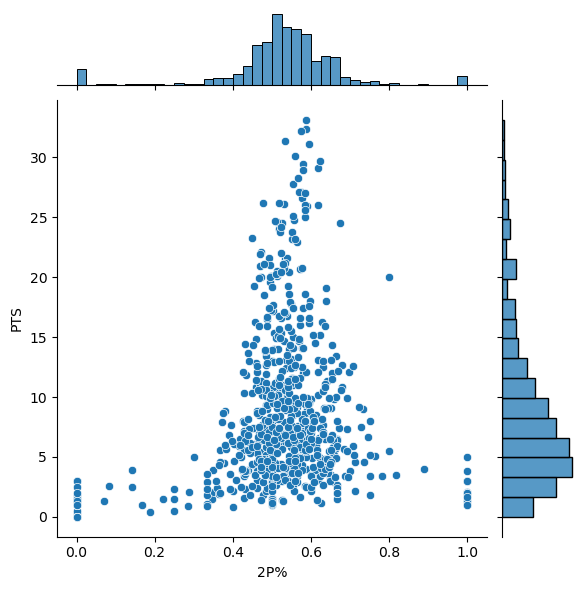

In [150]:
sns.jointplot(x='2P%', y='PTS', data=df3)

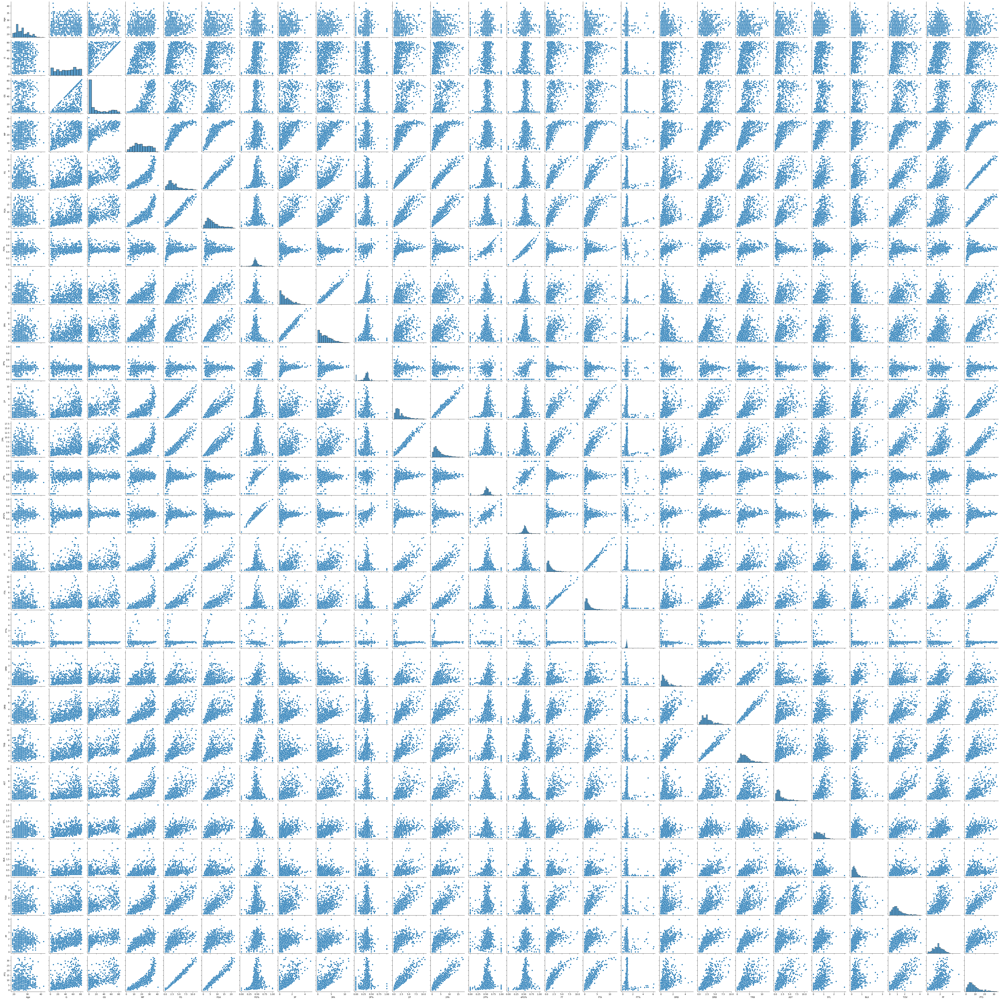

In [151]:
sns.pairplot(data=df3)

In [152]:
df3.head()

,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,Precious Achiuwa,C,23,TOR,55,12,20.7,3.6,7.3,0.485,...,0.702,1.8,4.1,6.0,0.9,0.6,0.5,1.1,1.9,9.2
1,Steven Adams,C,29,MEM,42,42,27.0,3.7,6.3,0.597,...,0.364,5.1,6.5,11.5,2.3,0.9,1.1,1.9,2.3,8.6
2,Bam Adebayo,C,25,MIA,75,75,34.6,8.0,14.9,0.540,...,0.806,2.5,6.7,9.2,3.2,1.2,0.8,2.5,2.8,20.4
3,Ochai Agbaji,SG,22,UTA,59,22,20.5,2.8,6.5,0.427,...,0.812,0.7,1.3,2.1,1.1,0.3,0.3,0.7,1.7,7.9
4,Santi Aldama,PF,22,MEM,77,20,21.8,3.2,6.8,0.470,...,0.750,1.1,3.7,4.8,1.3,0.6,0.6,0.8,1.9,9.0


In [153]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 679 entries, 0 to 678
Data columns (total 29 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Player  679 non-null    object 
 1   Pos     679 non-null    object 
 2   Age     679 non-null    int64  
 3   Tm      679 non-null    object 
 4   G       679 non-null    int64  
 5   GS      679 non-null    int64  
 6   MP      679 non-null    float64
 7   FG      679 non-null    float64
 8   FGA     679 non-null    float64
 9   FG%     679 non-null    float64
 10  3P      679 non-null    float64
 11  3PA     679 non-null    float64
 12  3P%     679 non-null    float64
 13  2P      679 non-null    float64
 14  2PA     679 non-null    float64
 15  2P%     679 non-null    float64
 16  eFG%    679 non-null    float64
 17  FT      679 non-null    float64
 18  FTA     679 non-null    float64
 19  FT%     679 non-null    float64
 20  ORB     679 non-null    float64
 21  DRB     679 non-null    float64
 22  TR

In [154]:
x=df3[['Age','G','GS','FG%','3P%','2P%','eFG%','FT%','ORB','DRB','TRB','AST','STL','BLK','TOV','PF']]
y=df3['PTS']

In [155]:
lm=LinearRegression()

In [156]:


x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=111)


In [157]:
lm.fit(x_train,y_train)

LinearRegression()

In [158]:
lm.coef_

array([-2.66714897e-02, -3.41224605e-03,  6.59365551e-02,  2.27313187e+00,
        6.13869746e+00,  4.43559965e+00, -3.88095998e+00, -1.67213178e-01,
        5.09268187e-01,  2.86856228e+00, -1.79117971e+00, -1.00097128e-01,
        1.27976022e+00,  9.21171582e-01,  4.49370919e+00, -8.61532418e-01])

In [159]:
predections=lm.predict(x_test)

In [160]:
predections.sum()

1208.9303318792831

In [161]:
y_test.sum()

1248.2999999999997

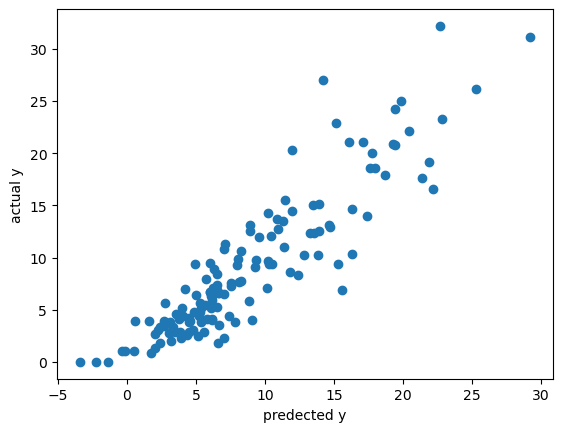

In [162]:
plt.scatter(predections,y_test)
plt.xlabel('predected y')
plt.ylabel('actual y')
plt.show()

In [163]:
from sklearn import metrics

print("mse", metrics.mean_squared_error(predections,y_test))
print("mae", metrics.mean_absolute_error(predections,y_test))
print("smse", np.sqrt(metrics.mean_squared_error(predections,y_test)))

mse 8.775066414876118
mae 2.1269971516452446
smse 2.9622738588584476


C:\Users\saura\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PTS', ylabel='Density'>

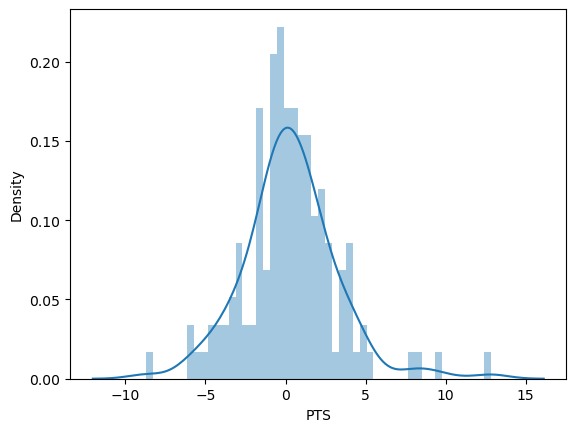

In [164]:
sns.distplot(y_test-predections, bins=50)

In [165]:
df3a=pd.DataFrame(lm.coef_,x.columns)
df3a.columns=['coefficient']
df3a

,coefficient
Age,-0.026671
G,-0.003412
GS,0.065937
FG%,2.273132
3P%,6.138697
2P%,4.435600
eFG%,-3.880960
FT%,-0.167213
ORB,0.509268
DRB,2.868562


In [166]:
y_test-predections

336    1.136286
320   -3.148356
600   -2.045161
616   -4.102654
190   -0.171425
         ...   
567   -8.711234
186    1.223593
298    2.253472
547    2.280402
421    1.160081
Name: PTS, Length: 136, dtype: float64

In [167]:
import pickle
file=open('basketball.dat', 'ab')
pickle.dump(predections,file)

In [168]:
file=open('basketball.dat','rb')
pickle.load(file)

array([-0.13628568,  6.64835618,  6.14516131, 12.40265422,  9.27142478,
       20.42503113, 10.49710854,  6.00612852, 19.29893001,  6.17541809,
        2.2227662 , 11.45039275, 14.61468398, 17.4038663 ,  8.91039414,
        5.67800185, -1.37189818, 10.12875897, 16.07384455,  5.29249978,
       13.91472535,  4.89628119,  3.54225924,  7.01286273, 10.19259497,
        7.82790583,  4.18385121, 15.31813386,  2.79896553, 10.22314308,
        5.40077487,  4.77878837, 11.3362632 ,  3.11746381, 14.19467261,
        6.51266116,  6.08157612, 15.16314739, 19.37714774,  8.1072669 ,
       10.26424167, 13.51662689,  1.73615531,  7.00739385, 17.75890869,
       10.9059943 ,  3.80855598, 13.29309653,  5.60560585,  2.71674852,
        4.51741703,  7.12258475, 29.21716512, -0.36492401, 22.67725679,
        5.81933024, 10.43824447,  4.46603767, 22.16386738, 16.31004984,
       11.41294606,  3.90563869,  3.07648237,  2.38956769,  0.6080168 ,
        4.0009605 , 25.27468379, 19.84345331, 17.98433817,  8.88

In [169]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report